<a href="https://colab.research.google.com/github/nikoshaa/2141720007-pcvk-2023/blob/main/Week-9/Week9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Morfologi (Erosi, Dilasi, Opening, Closing,
Transformasi Top-hat dan Bottom-hat, Skeleton, Thickening)**

Wildan Hafidz Mauludin

2141720007

**Praktikum**

1. Import folder yang ada di Drive Anda dengan cara sebagai berikut:

In [116]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2. Import beberapa library berikut yang akan digunakan selama uji coba praktikum minggu ke-6 berikut.

In [117]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

3. Buatlah fungsi dilasi serta tampilkan hasil dilasi pada citra dengan *Structuring Element Dilasi* (SED) berbentuk **cross 3 x 3 tanpa** menggunakan library *morphology* dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

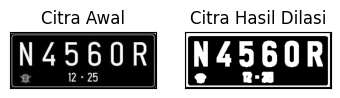

In [118]:
#Dilasi tanpa library
def dilasi_citra(F,w):
  #size image
  p,q= F.shape

  imgD= np.zeros((p,q), dtype=np.uint8)
  #Generate structure element dilasi (SED)
  SED= np.ones((w,w), dtype=np.uint8)
  constant1= (w-1)//2

  #Proses Dilasi
  for i in range(constant1, p-constant1):
    for j in range(constant1,q-constant1):
      temp= F[i-constant1:i+constant1+1, j-constant1:j+constant1+1]
      product= temp*SED
      imgD[i,j]= np.max(product)
  return imgD

img_d= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img_d, 125, 200, cv2.THRESH_BINARY)
w=5
imgD = dilasi_citra(thresh,w)
plt.subplot(131),plt.imshow(img_d,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(imgD,cmap = 'gray')
plt.title('Citra Hasil Dilasi'), plt.xticks([]), plt.yticks([])
plt.show()

4. Buatlah program implementasi operasi dilasi *Structuring Element Dilasi* (SED) berbentuk **cross 3 x 3 dengan** menggunakan library *morphology* dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

[[1 1 1]
 [1 1 1]
 [1 1 1]]


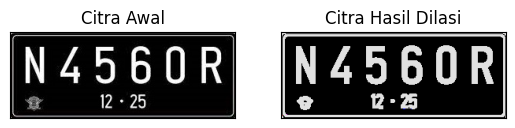

In [119]:
img = cv2.imread('/content/drive/MyDrive/plat_nomor.png')
#img = cv2.imread('morp.jpg',0)
ret, thresh = cv2.threshold(img, 127, 225, cv2.THRESH_BINARY)
kernel = np.ones((3,3),np.uint16)
dilasi = cv2.dilate(thresh,kernel,iterations = 1)
print(kernel)

plt.subplot(121),plt.imshow(img),plt.title('Citra Awal')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dilasi),plt.title('Citra Hasil Dilasi')
plt.xticks([]), plt.yticks([])
plt.show()

5. Buatlah fungsi erosi serta tampilkan hasil erosi pada citra dengan *Structuring Element Erosi* (SE) berbentuk square 5 x 5 **tanpa** menggunakan library morphology dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

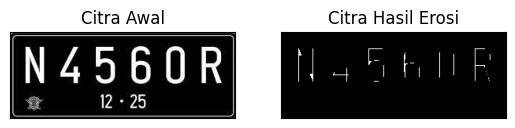

In [120]:
#Erosi Tanpa Library
def erosi_citra(F,k):
  #size image
  m,n= F.shape

  #Generate structure element erosi (SE)
  SE= np.ones((k,k), dtype=np.uint8)
  constant= (k-1)//2
  imgE= np.zeros((m,n), dtype=np.uint8)

  #Proses Erosi
  for i in range(constant, m-constant):
    for j in range(constant,n-constant):
      temp= F[i-constant:i+constant+1, j-constant:j+constant+1]
      product= temp*SE
      imgE[i,j]= np.min(product)
  return imgE

img_e= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret1, thresh1 = cv2.threshold(img_e, 175, 225, cv2.THRESH_BINARY)
k=5
imgE = erosi_citra(thresh1,k)

plt.subplot(121),plt.imshow(img_e,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgE,cmap = 'gray')
plt.title('Citra Hasil Erosi'), plt.xticks([]), plt.yticks([])
plt.show()

6. Buatlah program implementasi operasi dilasi *Structuring Element Erosi* (SE) berbentuk square 5 x 5 **dengan** menggunakan library *morphology* dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

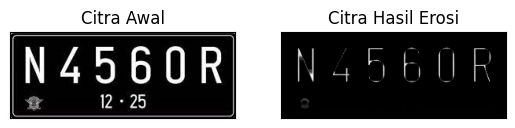

In [121]:
#erosi library
img = cv2.imread('/content/drive/MyDrive/plat_nomor.png')

kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(img,kernel,iterations = 1)

plt.subplot(121),plt.imshow(img),plt.title('Citra Awal')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(erosion),plt.title('Citra Hasil Erosi')
plt.xticks([]), plt.yticks([])
plt.show()

7. Buatlah program implementasi operasi opening dengan *Structuring Element* berbentuk square 3 x 3 **tanpa dan dengan** menggunakan library morphology dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

**Operasi Opening Menggunakan tanpa Library Morphology**

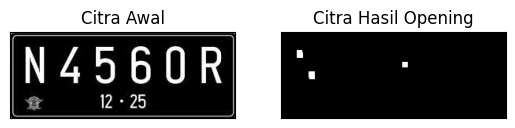

In [122]:
img_o= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
reto, thresho = cv2.threshold(img_o, 127, 225, cv2.THRESH_BINARY)
k=7
imgO = dilasi_citra(erosi_citra(thresho,k),k)

plt.subplot(121),plt.imshow(img_o,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgO,cmap = 'gray')
plt.title('Citra Hasil Opening'), plt.xticks([]), plt.yticks([])
plt.show()

**Operasi Opening Menggunakan Library Morphology**

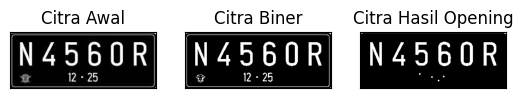

In [123]:
#Dengan Menggunakan Library
img = cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img, 127, 225, cv2.THRESH_BINARY)
kernel = np.ones((3,3),np.uint8)
openn = cv2.morphologyEx(thresh,cv2.MORPH_OPEN, kernel)

plt.subplot(131),plt.imshow(img,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(thresh,cmap = 'gray')
plt.title('Citra Biner'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(openn,cmap = 'gray')
plt.title('Citra Hasil Opening'), plt.xticks([]), plt.yticks([])
plt.show()

8. Buatlah program implementasi operasi closing dengan *Structuring Element* berbentuk square 3 x 3 **tanpa dan dengan** menggunakan library *morphology* dari openCV, sehingga menghasilkan tampilan seperti di bawah ini:

**Operasi Closing tanpa Library Morphology**

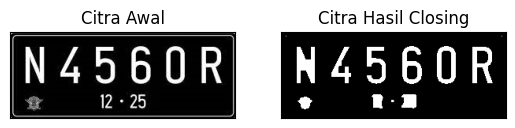

In [124]:
img_c= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
retc, threshc = cv2.threshold(img_c, 127, 225, cv2.THRESH_BINARY)
k=7
imgC = erosi_citra(dilasi_citra(threshc,k),k)

plt.subplot(121),plt.imshow(img_c,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgC,cmap = 'gray')
plt.title('Citra Hasil Closing'), plt.xticks([]), plt.yticks([])
plt.show()

**Operasi Closing dengan Library Morphology**

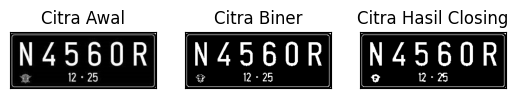

In [125]:
img = cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img, 127, 225, cv2.THRESH_BINARY)
kernel = np.ones((3,3),np.uint8)
closs = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE, kernel)

plt.subplot(131),plt.imshow(img,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(thresh,cmap = 'gray')
plt.title('Citra Biner'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(closs,cmap = 'gray')
plt.title('Citra Hasil Closing'), plt.xticks([]), plt.yticks([])
plt.show()

9. Buatlah program implementasi operasi dilasi dengan *Structuring Element* berbentuk **Cross 3 x 3 dan 5 x 5**, sehingga menghasilkan tampilan seperti di bawah ini:

Cross 3


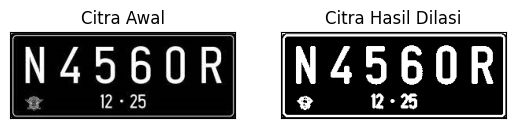

Cross 5


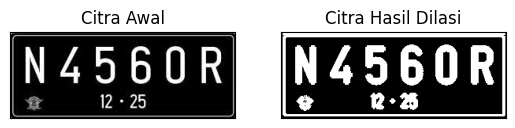

In [126]:
#Dilasi Cross SED
def dilasi_citra(F,w):
  #size image
  p,q= F.shape

  imgD= np.zeros((p,q), dtype=np.uint8)
  #Generate structure element dilasi (SED)
  # SED= np.ones((w,w), dtype=np.uint8)
  SED = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], dtype = np.uint8)
  constant1= (w-1)//2

  #Proses Dilasi
  for i in range(constant1, p-constant1):
    for j in range(constant1,q-constant1):
      temp= F[i-constant1:i+constant1+1, j-constant1:j+constant1+1]
      product= temp*SED
      imgD[i,j]= np.max(product)
  return imgD

print('Cross 3')
img_d= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img_d, 127, 225, cv2.THRESH_BINARY)
w=3
imgD = dilasi_citra(thresh,w)
plt.subplot(121),plt.imshow(img_d,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgD,cmap = 'gray')
plt.title('Citra Hasil Dilasi'), plt.xticks([]), plt.yticks([])
plt.show()

def dilasi_citra(F,w):
    #size image
    p,q= F.shape

    imgD= np.zeros((p,q), dtype=np.uint8)

    #Generate structure element dilasi (SED)
    # SED= np.ones((w,w), dtype=np.uint8)
    SED = np.array([[0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0],
                  [1, 1, 1, 1, 1],
                  [0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0]], dtype = np.uint8)
    constant1= (w-1)//2

    #Proses Dilasi
    for i in range(constant1, p-constant1):
      for j in range(constant1,q-constant1):
        temp= F[i-constant1:i+constant1+1, j-constant1:j+constant1+1]
        product= temp*SED
        imgD[i,j]= np.max(product)
    return imgD

print('Cross 5')
img_d= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img_d, 127, 225, cv2.THRESH_BINARY)
w=5
imgD = dilasi_citra(thresh,w)
plt.subplot(121),plt.imshow(img_d,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgD,cmap = 'gray')
plt.title('Citra Hasil Dilasi'), plt.xticks([]), plt.yticks([])
plt.show()

10. Buatlah program implementasi operasi dilasi dengan *Structuring Element* berbentuk **Circular 3 x 3 dan 5 x 5**, sehingga menghasilkan tampilan seperti di bawah ini:

Circle 3


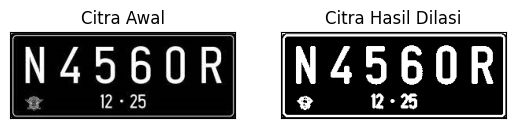

Circle 5


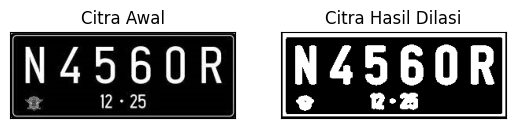

In [127]:
#Dilasi Circular SED
def dilasi_citra(F,w):
#size image
  p,q= F.shape
  imgD= np.zeros((p,q), dtype=np.uint8)
  #Generate structure element dilasi (SED)
  SED= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(w,w))
  constant1= (w-1)//2

  #Proses Dilasi
  for i in range(constant1, p-constant1):
    for j in range(constant1,q-constant1):
      temp= F[i-constant1:i+constant1+1, j-constant1:j+constant1+1]
      product= temp*SED
      imgD[i,j]= np.max(product)
  return imgD

print('Circle 3')
img_d= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img_d, 127, 225, cv2.THRESH_BINARY)
w=3
imgD = dilasi_citra(thresh,w)
plt.subplot(121),plt.imshow(img_d,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgD,cmap = 'gray')
plt.title('Citra Hasil Dilasi'), plt.xticks([]), plt.yticks([])
plt.show()

print('Circle 5')
img_d= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0)
ret, thresh = cv2.threshold(img_d, 127, 225, cv2.THRESH_BINARY)
w=5
imgD = dilasi_citra(thresh,w)
plt.subplot(121),plt.imshow(img_d,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgD,cmap = 'gray')
plt.title('Citra Hasil Dilasi'), plt.xticks([]), plt.yticks([])
plt.show()

11. Buatlah program implementasi operasi erosi dengan *Structuring Element* berbentuk **Rectangle 3 x 5 dan 5 x 7**, sehingga menghasilkan tampilan seperti di bawah ini:

Rectangle 3 x 5


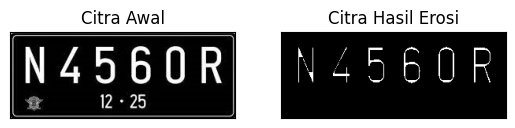

Rectangle 5 x 7


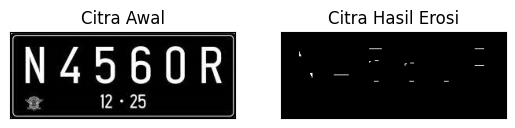

In [128]:
#Erosi Cross SE
def erosi_citra(F,p,l):
  #size image
  m,n= F.shape
  #Generate structure element erosi (SE)
  SE = cv2.getStructuringElement(cv2.MORPH_RECT,(p,l)) #SE persegi panjang
  constant1= (l-1)//2
  constant2= (p-1)//2
  # print(SE)
  imgE= np.zeros((m,n), dtype=np.uint8)
  #Proses Erosi
  for i in range(constant1, m-constant1):
    for j in range(constant2,n-constant2):
      temp= F[i-constant1:i+constant1+1, j-constant2:j+constant2+1]
      product= temp*SE
      imgE[i,j]= np.min(product)
  return imgE
print('Rectangle 3 x 5')
img_e= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0) #
ret1, thresh1 = cv2.threshold(img_e, 127, 225, cv2.THRESH_BINARY)
p=5
l=3
imgE = erosi_citra(thresh1,p,l)
plt.subplot(121),plt.imshow(img_e,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgE,cmap = 'gray')
plt.title('Citra Hasil Erosi'), plt.xticks([]), plt.yticks([])
plt.show()

print('Rectangle 5 x 7')
img_e= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0) #
ret1, thresh1 = cv2.threshold(img_e, 127, 225, cv2.THRESH_BINARY)
p=7
l=5
imgE = erosi_citra(thresh1,p,l)
plt.subplot(121),plt.imshow(img_e,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgE,cmap = 'gray')
plt.title('Citra Hasil Erosi'), plt.xticks([]), plt.yticks([])
plt.show()

12. Buatlah program implementasi operasi erosi dengan *Structuring Element* berbentuk **Line Vertikal 3 dan 5**, sehingga menghasilkan tampilan seperti di bawah ini: (Gunakan gambar j.png)

Line Vertikal 3


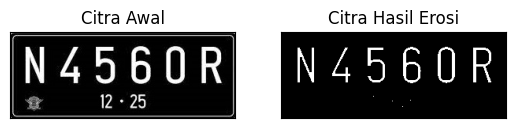

Line Vertikal 5


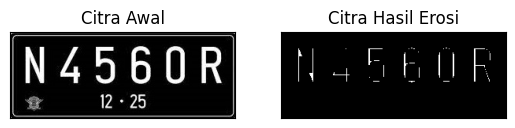

In [129]:
#Erosi Line Vertikal SE
def erosi_citra(F,k):
  #size image
  m,n= F.shape
  #Generate structure element erosi (SE)
  SE = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,k)) #SE line vertikal
  constant= (k-1)//2
  imgE= np.zeros((m,n), dtype=np.uint8)
  #Proses Erosi
  for i in range(constant, m-constant):
    for j in range(constant,n-constant):
      temp= F[i-constant:i+constant+1, j-constant:j+constant+1]
      product= temp*SE
      imgE[i,j]= np.min(product)
  return imgE

print('Line Vertikal 3')
img_e= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0) #
ret1, thresh1 = cv2.threshold(img_e, 127, 225, cv2.THRESH_BINARY)
k=3
imgE = erosi_citra(thresh1,k)
plt.subplot(121),plt.imshow(img_e,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgE,cmap = 'gray')
plt.title('Citra Hasil Erosi'), plt.xticks([]), plt.yticks([])
plt.show()

print('Line Vertikal 5')
img_e= cv2.imread('/content/drive/MyDrive/plat_nomor.png',0) #
ret1, thresh1 = cv2.threshold(img_e, 127, 225, cv2.THRESH_BINARY)
k=5
imgE = erosi_citra(thresh1,k)
plt.subplot(121),plt.imshow(img_e,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(imgE,cmap = 'gray')
plt.title('Citra Hasil Erosi'), plt.xticks([]), plt.yticks([])
plt.show()

13. TopHat

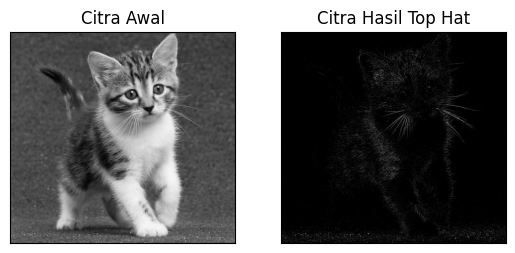

In [130]:
# Getting the kernel to be used in Top-Hat
filterSize =(3, 3)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, filterSize)

# Reading the image named 'input.jpg'
img = cv2.imread('/content/drive/MyDrive/kitten.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Applying the Top-Hat operation
tophat_img = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

#cv2.imshow("original", input_image)
#cv2.imshow("tophat", tophat_img)
#cv2.waitKey(5000)
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(tophat_img,cmap = 'gray')
plt.title('Citra Hasil Top Hat'), plt.xticks([]), plt.yticks([])
plt.show()

14. BlackHat

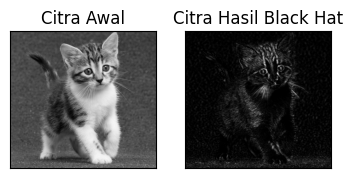

In [131]:
filterSize =(3, 3)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, filterSize)
# Reading the image named 'input.jpg'
img = cv2.imread('/content/drive/MyDrive/kitten.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Applying the Black-Hat operation
#tophat_img = cv2.morphologyEx(img,cv2.MORPH_BLACKHAT, kernel)
Kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
blackhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, Kernel)
#cv2.imshow("original", input_image)
#cv2.imshow("tophat", tophat_img)
#cv2.waitKey(5000)
plt.subplot(131),plt.imshow(img,cmap = 'gray')
plt.title('Citra Awal'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(blackhat,cmap = 'gray')
plt.title('Citra Hasil Black Hat'), plt.xticks([]), plt.yticks([])
plt.show()

15. Skeleton

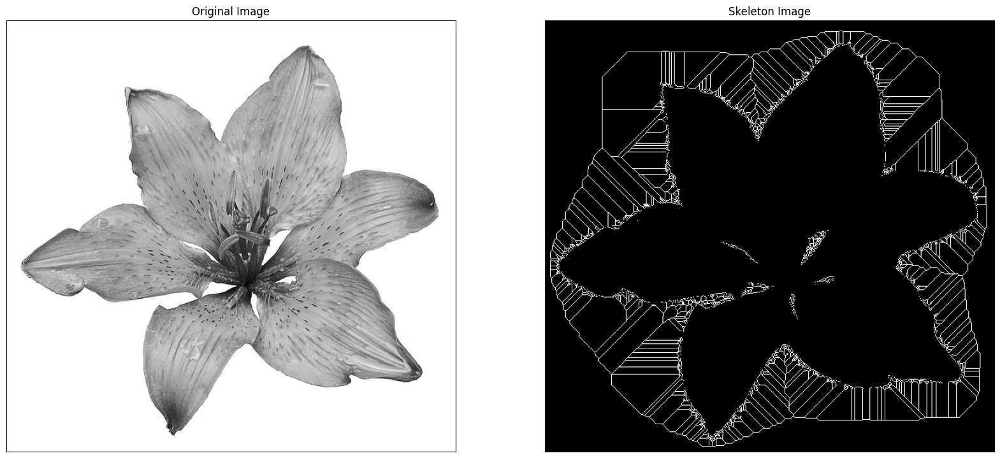

In [132]:
import cv2 as cv
from matplotlib import pyplot as plt
from skimage import filters

from skimage.morphology import skeletonize
# read image
img = cv.imread('/content/drive/MyDrive/lily.jpg',0)
binary = img > filters.threshold_triangle(img)
# true false to one
binary_cp = binary.copy()
binary_cp[binary_cp == True] = 1
binary_cp[binary_cp == False] = 0

# skeletonize image
skeleton = skeletonize(binary_cp)
# print images
plt.figure(figsize=(20,20))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(skeleton,cmap = 'gray')
plt.title('Skeleton Image'), plt.xticks([]), plt.yticks([])
plt.savefig("binary and bin_skeleton.png")
plt.show()

16. Skeleton Inverse

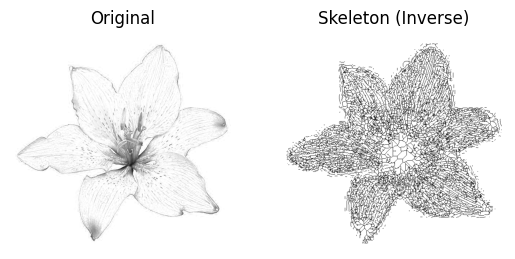

In [133]:
from skimage import io
from matplotlib import pyplot as plt
from skimage import filters
from skimage.morphology import skeletonize

# read image
img = io.imread('/content/drive/MyDrive/lily.jpg')[..., 0]
# Note: we want the black bits to be True, so use <
binary = img < filters.threshold_triangle(img)

# skeletonize image
skeleton = skeletonize(binary)

# print images
fig, ax = plt.subplots(1, 2)
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original')
ax[0].set_axis_off()
# note the reversed colormap, gray_r
ax[1].imshow(skeleton, cmap='gray_r')
ax[1].set_title('Skeleton (Inverse)')
ax[1].set_axis_off()
plt.show()

17. Thickening

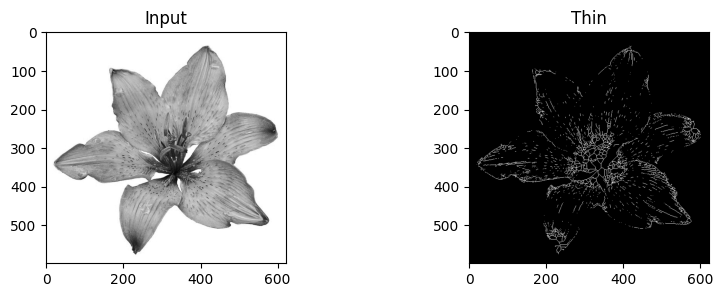

In [134]:
from skimage import img_as_float
from skimage import io, color, morphology
import matplotlib.pyplot as plt

image = img_as_float(color.rgb2gray(io.imread('/content/drive/MyDrive/lily.jpg')))
image_binary = image < 0.5
out_skeletonize = morphology.skeletonize(image_binary)
out_thin = morphology.thin(image_binary)

f, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 3))

ax0.imshow(image, cmap='gray')
ax0.set_title('Input')
ax1.imshow(out_thin, cmap='gray')

ax1.set_title('Thin')
plt.savefig('/tmp/char_out.png')
plt.show()

**Tugas Praktikum**

Tugas Praktikum Morfologi melibatkan implementasi dataset KTP yang terdapat dalam Modul 7.

Dalam tugas ini, kita akan menggunakan semua informasi yang disediakan dalam modul Morfologi dan menerapkan sejumlah nilai tambahan dalam kode sumber.

Tujuannya adalah agar citra KTP dapat terbaca dengan baik ketika teknik morfologi diterapkan pada citra tersebut.

KTP Asli

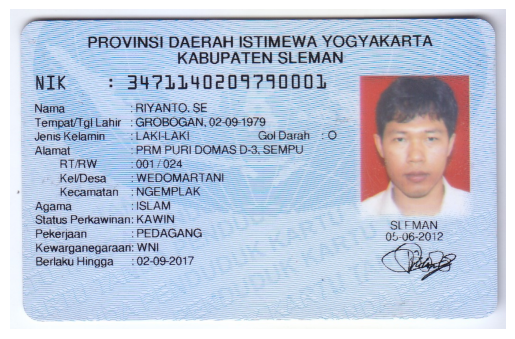

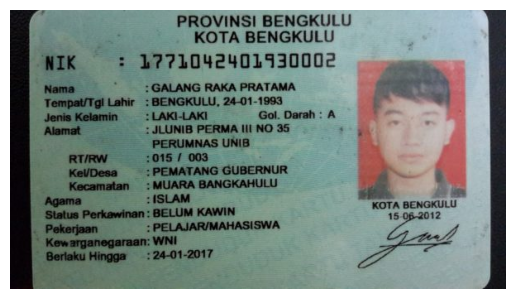

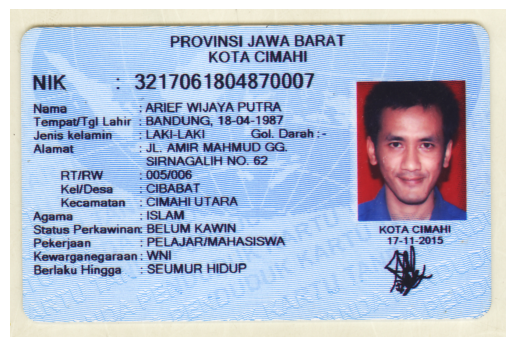

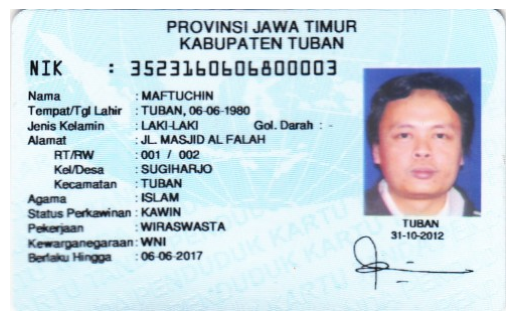

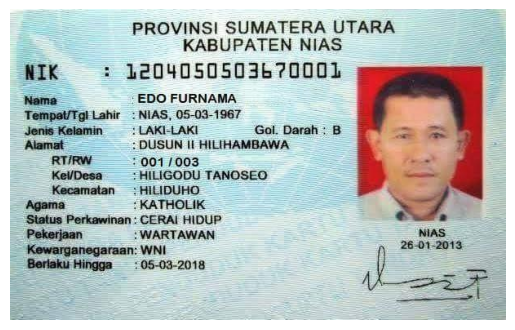

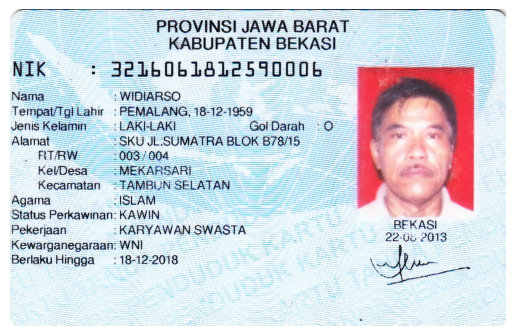

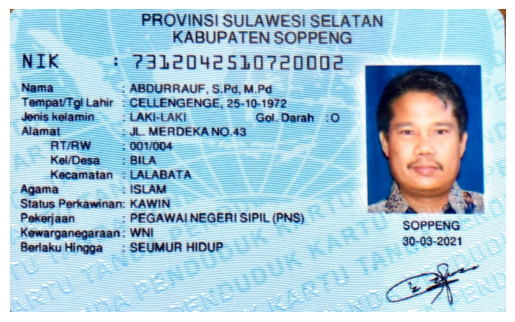

In [135]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # path cv2.imshow di google colab
import os
import random
from sklearn.cluster import KMeans
import math

directory = "/content/drive/MyDrive/KTP"

# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

KTP Hasil Erosi

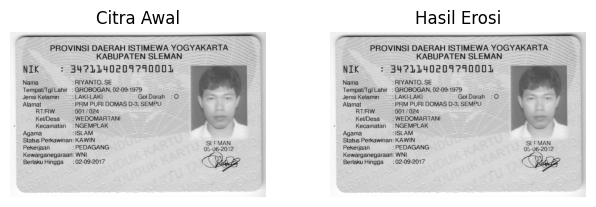

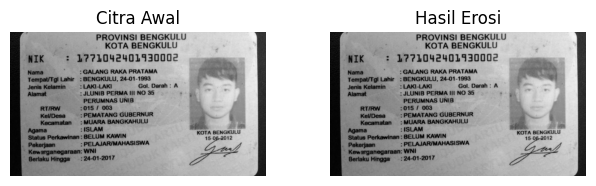

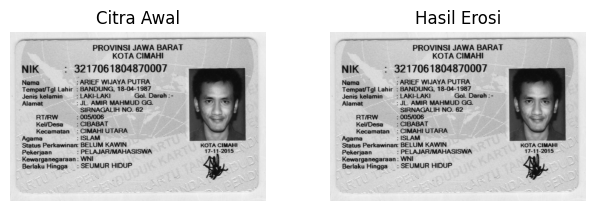

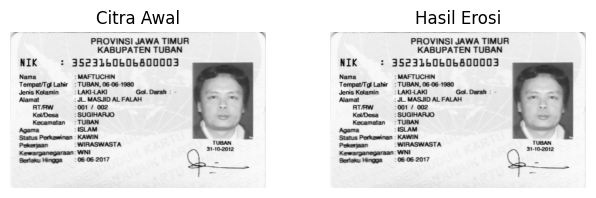

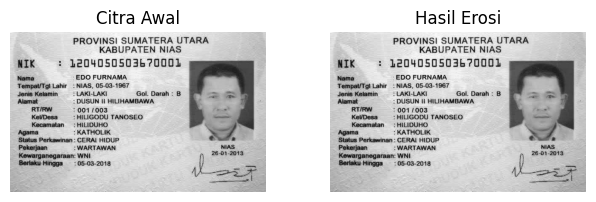

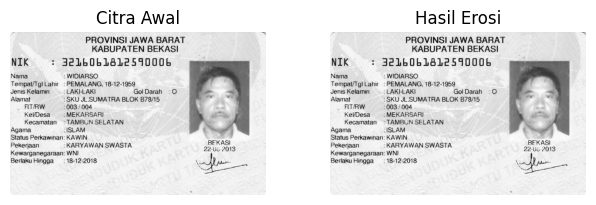

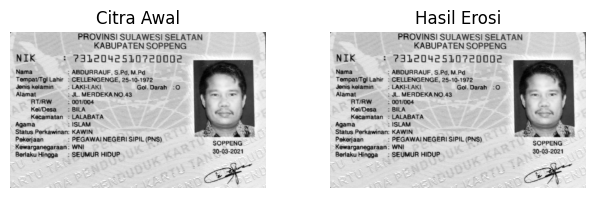

In [136]:
# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk Erosi (misalnya, square 3x3)
    k = 1
    SE = np.ones((k, k), np.uint8)

    # Operasi Erosi
    img_dilated = cv2.dilate(img, SE, iterations=1)

    # Tampilkan hasil Erosi
    fig = plt.figure()
    ax1 = fig.add_axes([0.1, 0.1, 0.4, 0.8])
    ax2 = fig.add_axes([0.6, 0.1, 0.4, 0.8])

    ax1.imshow(img, cmap='gray')
    ax1.set_title('Citra Awal')
    ax1.axis('off')

    ax2.imshow(img_dilated, cmap='gray')
    ax2.set_title('Hasil Erosi')
    ax2.axis('off')

    plt.show()

KTP Hasil Dilasi

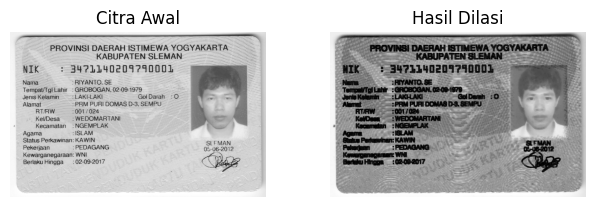

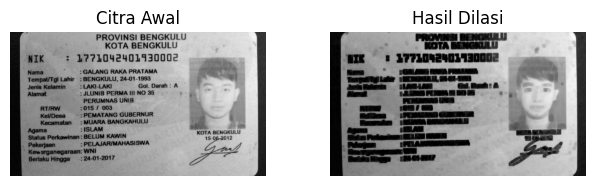

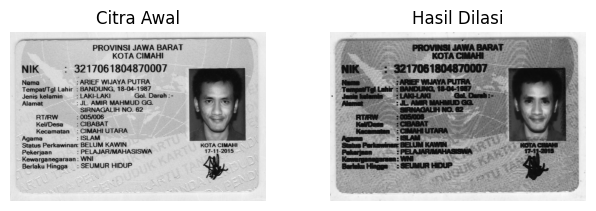

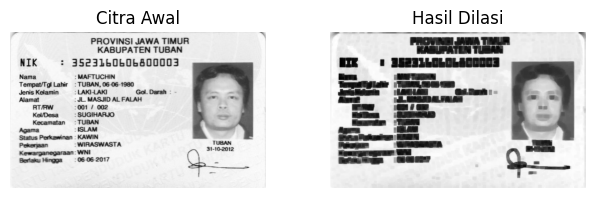

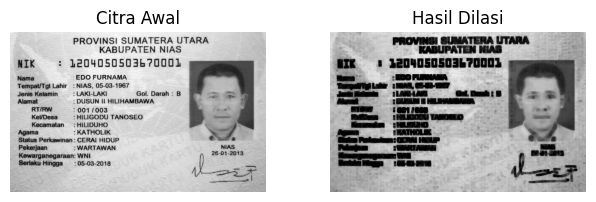

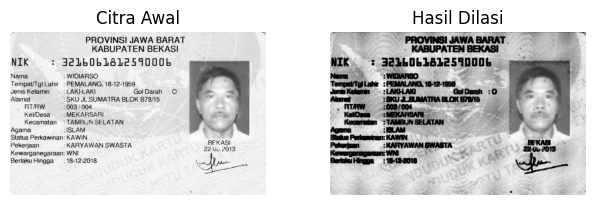

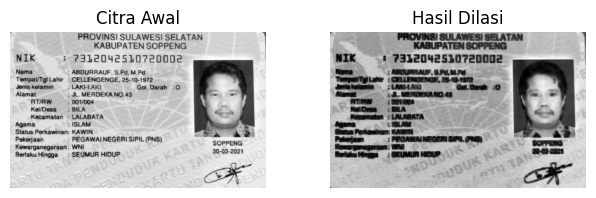

In [137]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk Dilasi (misalnya, square 3x3)
    k = 5
    SE = np.ones((k, k), np.uint8)

    # Operasi Dilasi
    img_eroded = cv2.erode(img, SE, iterations=1)

    # Tampilkan hasil Dilasi
    fig = plt.figure()
    ax1 = fig.add_axes([0.1, 0.1, 0.4, 0.8])
    ax2 = fig.add_axes([0.6, 0.1, 0.4, 0.8])

    ax1.imshow(img, cmap='gray')
    ax1.set_title('Citra Awal')
    ax1.axis('off')

    ax2.imshow(img_eroded, cmap='gray')
    ax2.set_title('Hasil Dilasi')
    ax2.axis('off')

    plt.show()

KTP Hasil Opening

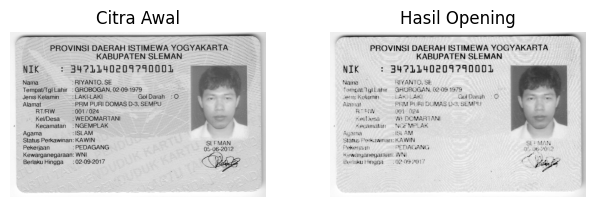

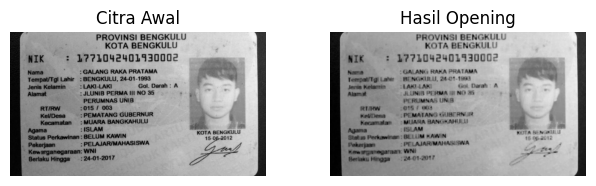

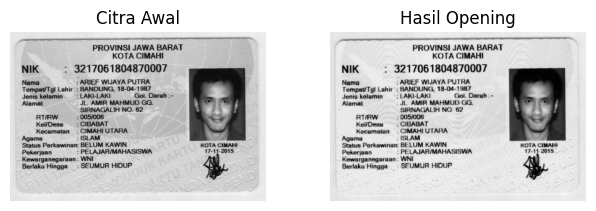

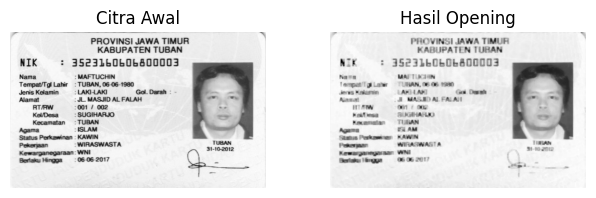

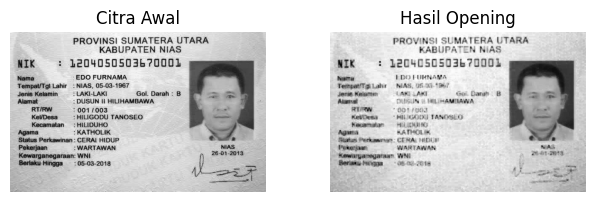

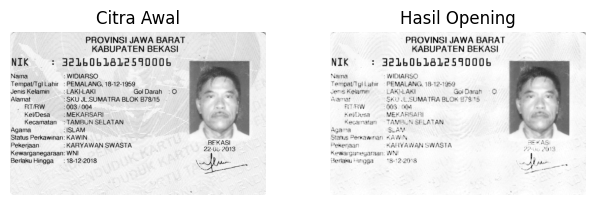

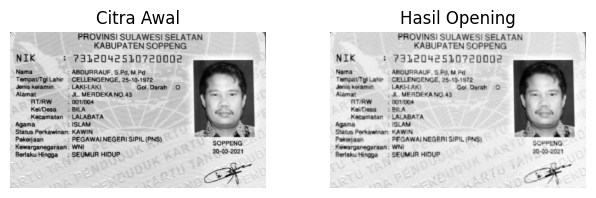

In [138]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk Opening (misalnya, square 3x3)
    k_Opening = 3
    SE_Opening = np.ones((k_Opening, k_Opening), np.uint8)

    # Operasi Opening
    img_closed = cv2.morphologyEx(img, cv2.MORPH_CLOSE, SE_Opening)

    # Tampilkan hasil Opening
    fig = plt.figure()
    ax1 = fig.add_axes([0.1, 0.1, 0.4, 0.8])
    ax2 = fig.add_axes([0.6, 0.1, 0.4, 0.8])

    ax1.imshow(img, cmap='gray')
    ax1.set_title('Citra Awal')
    ax1.axis('off')

    ax2.imshow(img_closed, cmap='gray')
    ax2.set_title('Hasil Opening')
    ax2.axis('off')

    plt.show()

KTP Hasil Black Hat

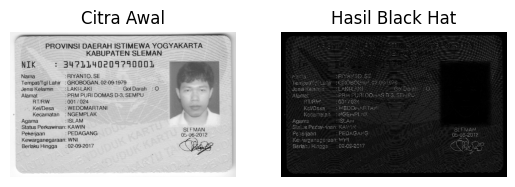

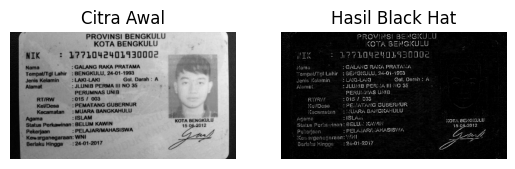

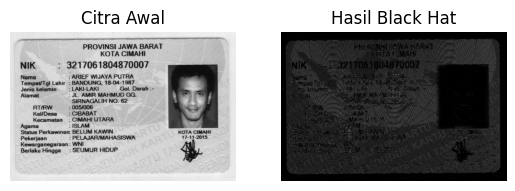

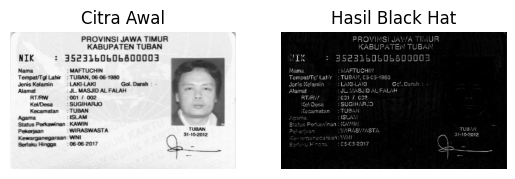

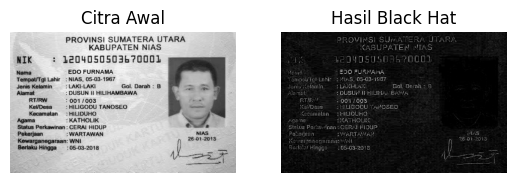

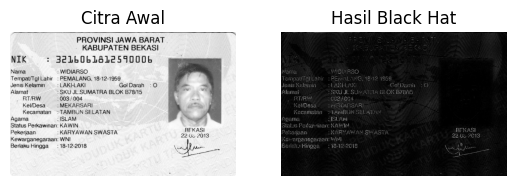

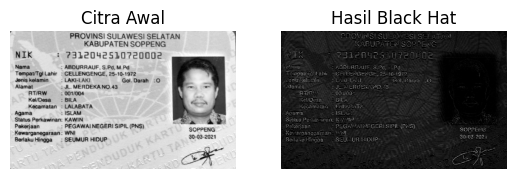

In [139]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk Black Hat (misalnya, square 3x3)
    k_blackhat = 3
    SE_blackhat = np.ones((k_blackhat, k_blackhat), np.uint8)

    # Operasi Black Hat
    img_blackhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, SE_blackhat)

    # Tampilkan hasil Black Hat
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img, cmap='gray')
    axs[0].set_title('Citra Awal')
    axs[0].axis('off')

    axs[1].imshow(img_blackhat, cmap='gray')
    axs[1].set_title('Hasil Black Hat')
    axs[1].axis('off')

    plt.show()

KTP Hasil Top Hat

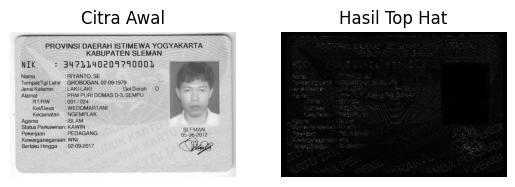

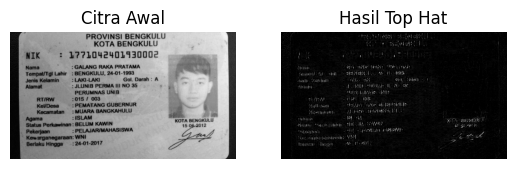

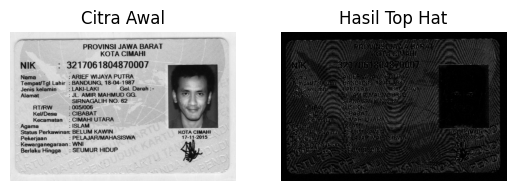

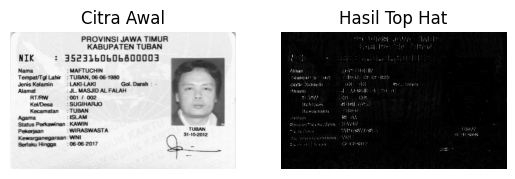

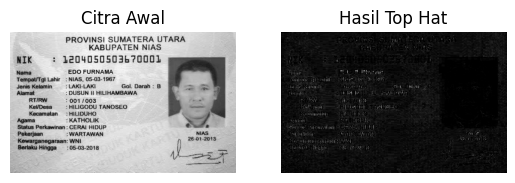

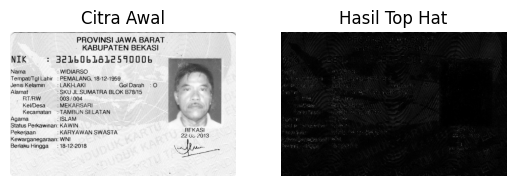

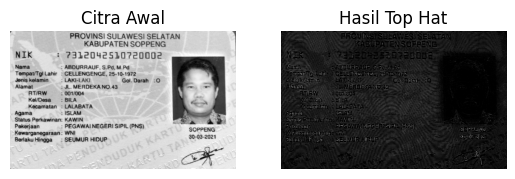

In [140]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk Top Hat (misalnya, square 3x3)
    k_tophat = 3
    SE_tophat = np.ones((k_tophat, k_tophat), np.uint8)

    # Operasi Top Hat
    img_tophat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, SE_tophat)

    # Tampilkan hasil Top Hat
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img, cmap='gray')
    axs[0].set_title('Citra Awal')
    axs[0].axis('off')

    axs[1].imshow(img_tophat, cmap='gray')
    axs[1].set_title('Hasil Top Hat')
    axs[1].axis('off')

    plt.show()

KTP Hasil Closing

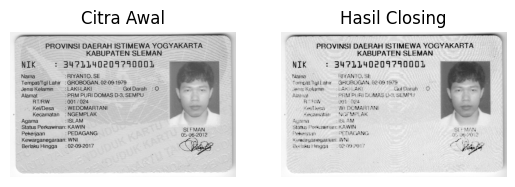

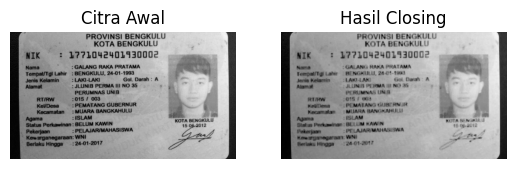

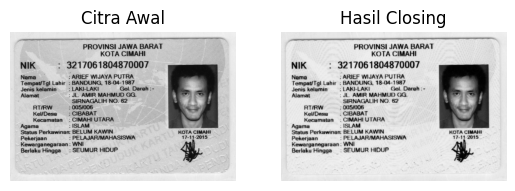

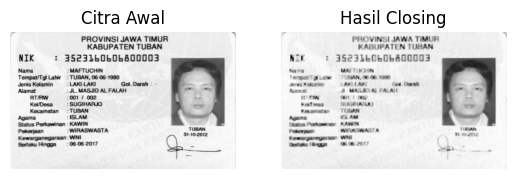

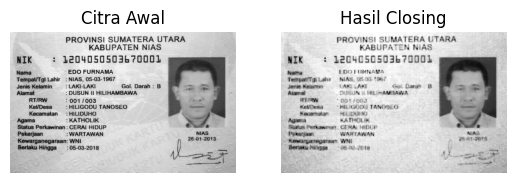

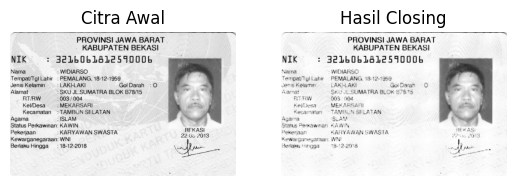

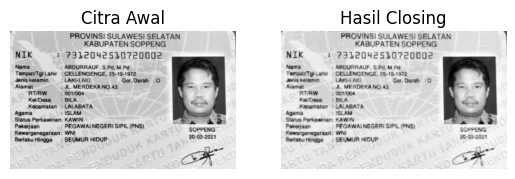

In [141]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk operasi closing (misalnya, square 3x3)
    k_closing = 3
    SE_closing = np.ones((k_closing, k_closing), np.uint8)

    # Operasi closing
    img_closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, SE_closing)

    # Tampilkan hasil closing
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img, cmap='gray')
    axs[0].set_title('Citra Awal')
    axs[0].axis('off')

    axs[1].imshow(img_closing, cmap='gray')
    axs[1].set_title('Hasil Closing')
    axs[1].axis('off')

    plt.show()

KTP Hasil Bottom Hat

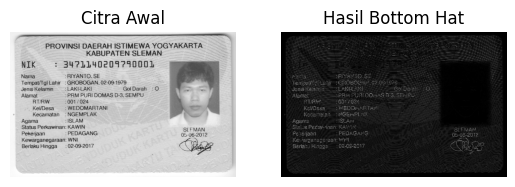

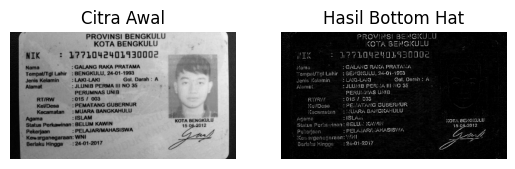

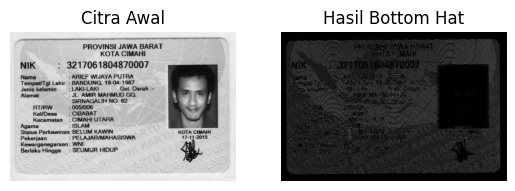

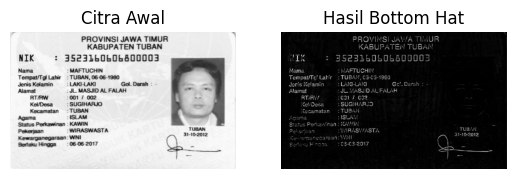

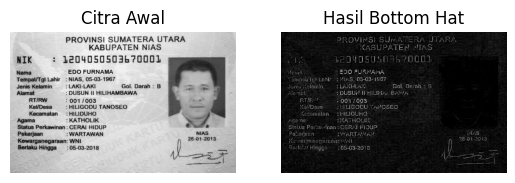

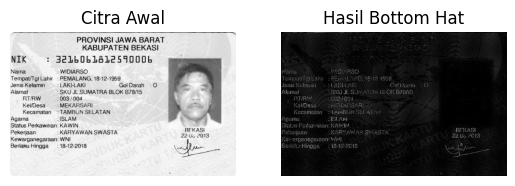

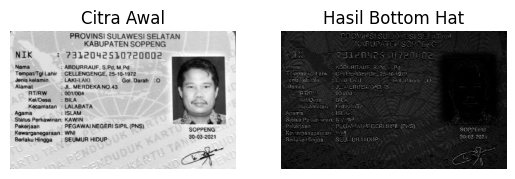

In [142]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Tentukan ukuran Structuring Element (SE) untuk operasi bottom hat (misalnya, square 3x3)
    k_bottomhat = 3
    SE_bottomhat = np.ones((k_bottomhat, k_bottomhat), np.uint8)

    # Operasi bottom hat
    img_bottomhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, SE_bottomhat)

    # Tampilkan hasil bottom hat
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img, cmap='gray')
    axs[0].set_title('Citra Awal')
    axs[0].axis('off')

    axs[1].imshow(img_bottomhat, cmap='gray')
    axs[1].set_title('Hasil Bottom Hat')
    axs[1].axis('off')

    plt.show()

KTP Hasil Skeleton

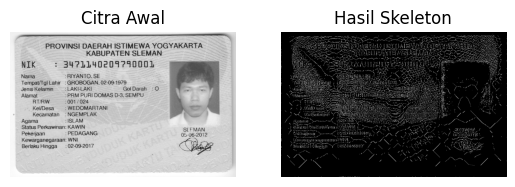

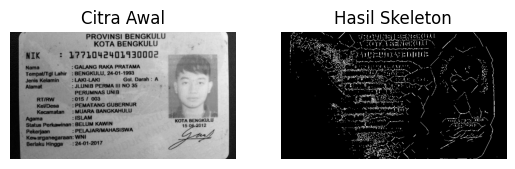

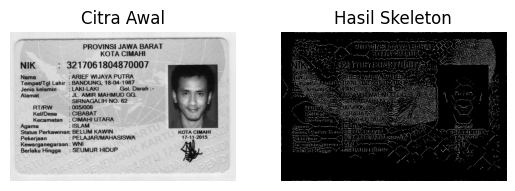

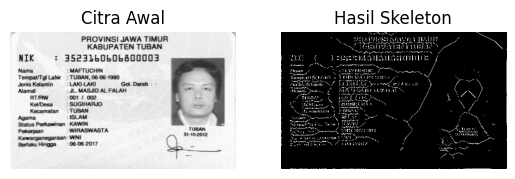

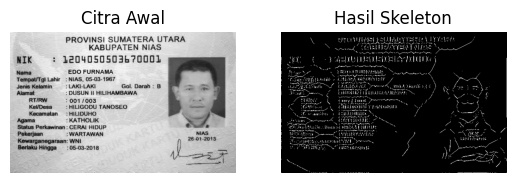

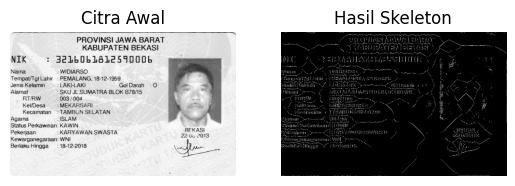

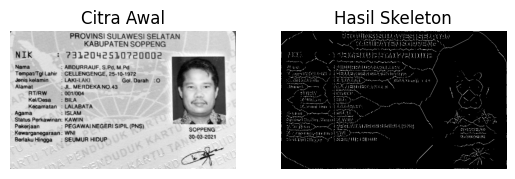

In [143]:
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path, 0)  # Baca gambar sebagai citra grayscale

    # Threshold gambar untuk mendapatkan citra biner
    ret, img_binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

    # Dapatkan skeleton dari citra biner
    size = np.size(img_binary)
    skel = np.zeros(img_binary.shape, np.uint8)

    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
    done = False

    while(not done):
        eroded = cv2.erode(img_binary, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(img_binary, temp)
        skel = cv2.bitwise_or(skel, temp)
        img_binary = eroded.copy()

        zeros = size - cv2.countNonZero(img_binary)
        if zeros==size:
            done = True

    # Tampilkan hasil skeleton
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img, cmap='gray')
    axs[0].set_title('Citra Awal')
    axs[0].axis('off')

    axs[1].imshow(skel, cmap='gray')
    axs[1].set_title('Hasil Skeleton')
    axs[1].axis('off')

    plt.show()